# Assignment 3 Artificial Intelligence
## T.S.P with Genetic Algorithm

### Ujjwal Sharma
### BT18CSE021
### usharma@students.vnit.ac.in


##Importing Modules

In [33]:
from random import randint , shuffle , random , choice
import time

#Class OffSpring
This class will contain the path , pathCost and fitness (1/pathCost) .
I have selected fitness as 1/pathCost as it helps converge the procedure faster . i have also tried only using the pathCost but it taked 10-30% more time as compaired to fitness

In [34]:
class OffSpring:
    def __init__(self , path , graph) -> None:
        # To store the path
        self.path = path
        # Path Cost is the sum of distances b/w cities in path
        self.pathCost = self.pathCostOfOffspring(graph)
        # fitness is 1/pathCost
        self.fitness = self.fitnessOfOffspring()

    def pathCostOfOffspring(self, graph):
        pathCost = 0
        path = self.path
        parent = path[0]
        i = 1
        while i<len(path):
            pathCost+=graph[parent][path[i]]
            parent = path[i]
            i+=1
        return pathCost

    def fitnessOfOffspring(self):
        return 1/ (self.pathCost + 1)

# Partial Mapped Crossover
After choosing two random cut points on parents to build offspring, the portion between cut points, one parent’s string is mapped onto the other parent’s string and the remaining information is exchanged. <br>
###Parent1 =(3 4 8| 2 7 1 |6 5) <br>
###Parent2 =(4 2 5| 1 6 8 |3 7) <br>
1. <br>
𝑂1=(× × ×|168|××) <br>
𝑂=(× × ×|271|××)
2.<br>
𝑂1 =(3 4 ×| 1 6 8 |× 5)<br>
𝑂2=(4 × 5|271|3×)
3.<br>
𝑂1 =(3 4 2| 1 6 8 |7 5)<br>
𝑂2=(485|271|36)


##𝑂ffSpring1 = (3 4 2| 1 6 8 |7 5)<br>
##𝑂ffSpring2 = (4 8 5| 2 7 1| 3 6)

In [35]:

def PartialMappedCrossover(parent1 , parent2 , graph):
    path1 = parent1.path[1:-1] # because start state and end state are fixed
    path2 = parent2.path[1:-1] # because start state and end state are fixed
    start = parent1.path[0]

    # selecting 1/3 of the path
    oneThirdLength = len(path1)//3 + 1
    # randomly selectiong the points
    startIndex = randint(0 , len(path1) - oneThirdLength )
    endIndex = startIndex + oneThirdLength - 1

    # print(startIndex , endIndex)

    pathOffspring1 = [-1]*len(path1)
    pathOffspring2 = [-1]*len(path2)
    
    # Exchanging the slices
    for i in range(startIndex , endIndex + 1):
        pathOffspring1[i] = path2[i]
        pathOffspring2[i] = path1[i]
    
    # Completing the path of offspring 1 i.e corresponding mapping of parent 1
    path1set = set(pathOffspring1)
    i = 0
    j = 0
    while i<len(path1) and j<len(pathOffspring1):
        if path1[i] in path1set:
            i+=1
            continue
        if pathOffspring1[j] != -1:
            j+=1
            continue
        pathOffspring1[j] = path1[i]
        path1set.add(path1[i])
        i+=1
        j+=1
    
    # Completing the path of offspring 2 i.e corresponding mapping of parent 2
    path2set = set(pathOffspring2)
    i = 0
    j = 0
    while i<len(path2) and j<len(pathOffspring2):
        if path2[i] in path2set:
            i+=1
            continue
        if pathOffspring2[j] != -1:
            j+=1
            continue
        pathOffspring2[j] = path2[i]
        path2set.add(path2[i])
        i+=1
        j+=1
    


    # print(pathOffspring1)
    # print(pathOffspring2)



    # Adding the start cities to offsprings' paths
    pathOffspring1.insert(0 , start)
    pathOffspring2.insert(0,start)
    pathOffspring1.append(start)
    pathOffspring2.append(start)
    
    # making the offsprings with specified paths
    OffSpring1 = OffSpring(pathOffspring1 , graph)
    OffSpring2 = OffSpring(pathOffspring2 , graph)
    return OffSpring1 , OffSpring2


#Order Cross Over Mapping 
Using this technique to create offspring in such a way that each bit with its position comes from one of the parents. For example, consider the tours of two parents:
##Parent1 =(3 4 8| 2 7 1 |6 5)<br>
##Parent2 =(4 2 5| 1 6 8 |3 7)<br>
1. <br>
𝑂1=(× × ×|271|××)<br>
𝑂2=(× × ×|168|××)
2.<br>
𝑂1=(568|271|34)<br>
𝑂2=(427|168|53).


##OffSpring1 = (568|271|34)
##OffSpring2 = (427|168|53)


In [36]:

def orderCrossOverFunction(parent1 , parent2 , graph):
    path1 = parent1.path[1:-1] # because start state and end state are fixed
    path2 = parent2.path[1:-1] # because start state and end state are fixed
    start = parent1.path[0]

    # selecting 1/3 of the path
    oneThirdLength = len(path1)//3 + 1
    startIndex = randint(0 , len(path1) - oneThirdLength )
    endIndex = startIndex + oneThirdLength - 1


    pathOffspring1 = [-1]*len(path1)
    pathOffspring2 = [-1]*len(path2)

    # Keeping the slices
    for i in range(startIndex , endIndex + 1):
        pathOffspring1[i] = path1[i]
        pathOffspring2[i] = path2[i]
    
    # Completing the path of offspring 1 by exchanging the mapping of parent 2 in cyclic order
    j = (endIndex+1) % (len(path2))
    i = j
    set1 = set(path1[startIndex:endIndex+1])
    while len(set1)!=len(path1):
        if path2[j] in set1:
            j = (j+1) % len(path1)
            continue
        pathOffspring1[i] = path2[j]
        set1.add(path2[j])
        j = (j+1) % len(path2)
        i = (i+1) % len(path2)
        

    # Completing the path of offspring 2 by exchanging the mapping of parent 1 in cyclic order
    j = (endIndex+1) % (len(path2))
    i = j
    set2 = set(path2[startIndex:endIndex+1])
    while len(set2)!=len(path1):
        if path1[j] in set2:
            j = (j+1) % len(path1)
            continue
        pathOffspring2[i] = path1[j]
        set2.add(path1[j])
        j = (j+1) % len(path2)
        i = (i+1) % len(path2)
        
    # print(pathOffspring1)
    # print(pathOffspring2)

    # Adding the start cities to offsprings' paths
    pathOffspring1.insert(0 , start)
    pathOffspring2.insert(0,start)
    pathOffspring1.append(start)
    pathOffspring2.append(start)
    
    # making the offsprings with specified paths
    OffSpring1 = OffSpring(pathOffspring1 , graph)
    OffSpring2 = OffSpring(pathOffspring2 , graph)
    return OffSpring1 , OffSpring2


#Random Crossover

In [37]:

def randomCrossover(parent1 , parent2 , graph):
    path1 = parent1.path[1:-1] # because start state and end state are fixed
    path2 = parent2.path[1:-1] # because start state and end state are fixed
    start = parent1.path[0]

    # randomly selecting the index 
    randomIndex = randint(1 , len(path1) - 2)

    pathOffspring1 = [-1]*len(path1)
    pathOffspring2 = [-1]*len(path2)

    # exchanging the information
    pathOffspring1[randomIndex:] = path2[randomIndex:]
    pathOffspring2[randomIndex:] = path1[randomIndex:]


    # Completing the path of offspring 1 i.e corresponding mapping of parent 1
    path1set = set(pathOffspring1)
    i = 0
    j = 0
    while i<len(path1) and j<len(pathOffspring1):
        if path1[i] in path1set:
            i+=1
            continue
        if pathOffspring1[j] != -1:
            j+=1
            continue
        pathOffspring1[j] = path1[i]
        path1set.add(path1[i])
        i+=1
        j+=1
    
    # Completing the path of offspring 2 i.e corresponding mapping of parent 2
    path2set = set(pathOffspring2)
    i = 0
    j = 0
    while i<len(path2) and j<len(pathOffspring2):
        if path2[i] in path2set:
            i+=1
            continue
        if pathOffspring2[j] != -1:
            j+=1
            continue
        pathOffspring2[j] = path2[i]
        path2set.add(path2[i])
        i+=1
        j+=1
    

    # Adding the start cities to offsprings' paths
    pathOffspring1.insert(0 , start)
    pathOffspring2.insert(0,start)
    pathOffspring1.append(start)
    pathOffspring2.append(start)
    
    # making the offsprings with specified paths
    OffSpring1 = OffSpring(pathOffspring1 , graph)
    OffSpring2 = OffSpring(pathOffspring2 , graph)
    return OffSpring1 , OffSpring2


#Mutate Function
cannot drop cities therefore
Exchanging city positions and hence creating new OffSprings

In [38]:

def mutate(path , graph):
    start = path[0]
    newPath = path[1:-1]
    # randomly selecting 2 indexces that are not equal
    i = randint(0 , len(newPath)-1)
    j = randint(0 , len(newPath)-1)
    while i == j:
        j = randint(0 , len(newPath)-1)

    # Mutating the path i.e exchanging the city
    newPath[i] , newPath[j] = newPath[j] , newPath[i]
    # inserting the starting city to the mutated path
    newPath.insert(0 , start)
    newPath.append(start)
    # making mutated Offspring
    mutatedOffSpring = OffSpring(newPath , graph)
    return mutatedOffSpring

# General Genetic Algorithms
### Takes Graph , Time(Generations = 1000 default) , Population Size (100 default) and Cross Over Operator (Order CrossOver default) , Mutation rate (mutation Probability = mutation rate * 100 , 0.01 (1%) default) , Selection Percentage (25% default)

It first makes random populations and then actually start the new generations.<br>
In each generation it randomly selects 2 parents and generate 2 OffSprings (as opposed to 1) and add them in new population .<br>
Now I have delibrately added an elimination code that selects only best selection percentage (25% by default) of the new population so as to make the new generations better
<br>

I am also selection the child with best fitness (i.e least path cost) and also noting the average fitness and minimum path cost of every generation


In [39]:

def GeneticAlgorithm(graph , Time = 1000 , populationSize = 100 , crossOverFunction = orderCrossOverFunction , mutationRate = 0.01 , selectionPercentage = 25):
    print("\n\n\n\n")

    print("Cross Over Function Used :" , crossOverFunction.__name__)

    print("\n\n\n\n")

    # Making the initial population by randomly sampling the paths with specidfied start city
    cities = list(graph.keys())
    start = cities[0]
    cities.pop(0)
    population = []
    for i in range(populationSize):
        shuffle(cities)
        offSpringPath = [start] + cities[:] + [start]
        offSpring = OffSpring(offSpringPath , graph)
        population.append(offSpring)
    
    # Now only selecting the population that have high fitness i.e elimination of the weak .. ;)
    # i have choosen the default to 25% best Offsprings from the total population
    # one can specify any value

    # here i have sorted the population on the bases of fitness (decreasing) i.e 
    # in the pathCost are in increasing order

    selectionRate = 100/selectionPercentage 

    population = sorted(population , key= lambda x : x.fitness , reverse=True)[0:int(populationSize//selectionRate)+1]

    epochs = Time
    avgFitnessScore = []
    minPathScore = []
    minPathCost = float('inf')
    MinOffspring : OffSpring
    MinOffspringGeneration = 0
    printLimit = epochs // 4


    # this is to measure the performance of the algorithm
    startTime = time.time()


    for epoch in range(epochs):
        newPopulation = []
        # this set is to make sure that the offsprings doesnot have same path in new Population i.e no duplicates
        newPopulationSet = set()
        if epoch%printLimit == 0:
            print(epoch/epochs*100)
        # this loop is to generate offsprings that are to be added in the newPopulation
        for i in range(populationSize):
            # randomly selecting the parents that are different
            parent1 = choice(population)
            parent2 = choice(population)
            while parent1 == parent2:
                parent2 = choice(population)

            # Creating the offsprings by the specified crossover function
            offSpring1 , offSpring2 = crossOverFunction(parent1 , parent2 , graph)

            # mutating the offspring with a  mutation probability of 1% (default)
            # this is the mutation rate . Mutation Probability = mutation rate * 100
            if random() <= mutationRate:
                offSpring1 = mutate(offSpring1.path , graph)
            if random() <= mutationRate:
                offSpring2 =  mutate(offSpring2.path , graph)

            # checking for duplicate paths in the new Population and if not found
            # add to the new population

            p1 = ','.join([str(x) for x in offSpring1.path])
            if p1 not in newPopulationSet:
                newPopulation.append(offSpring1)
                newPopulationSet.add(p1)
            
            p2 = ','.join([str(x) for x in offSpring2.path])
            if p2 not in newPopulationSet:
                newPopulation.append(offSpring2)
                newPopulationSet.add(p2)
        
        avgFitness = 0
        minPathCostPopulation = float('inf')

        # again selecting selectionPercentage of the new population
        newPopulation = sorted(newPopulation , key= lambda x : x.fitness , reverse=True)[0:int(populationSize//selectionRate) +1]
        population = newPopulation[:]
        if epoch%printLimit == 0:
            print([x.pathCost for x in newPopulation])
        
        # calculating the average fitness of the new Population
        for offSpring in newPopulation:
            avgFitness += offSpring.fitness

        avgFitness/=len(newPopulation)
        
        
        # minPathCostPopulation = float('inf')
        # ind = -1
        # for i,offspring in enumerate(newPopulation):
        #     if offspring.pathCost < minPathCostPopulation:
        #         minPathCostPopulation = offspring.pathCost
        #         ind = i

        minPathCostPopulation = newPopulation[0].pathCost
    
        if minPathCostPopulation < minPathCost:
            minPathCost = minPathCostPopulation
            MinOffspring = newPopulation[0]   
            MinOffspringGeneration = epoch+1 

        # keeping track of average fitness and minimum path cost for every generation
        avgFitnessScore.append([epoch+1 , avgFitness])
        minPathScore.append([epoch+1  , minPathCostPopulation])

    endTime = time.time() 

    # Total time taken by the algorithm
    totalTimeTaken = endTime - startTime

    print('\n\n')
    print("Total Time Taken for %d generations using %s crossover is %f seconds " %(Time , crossOverFunction.__name__ , totalTimeTaken))


    print('\n\n\n')
    return MinOffspring ,MinOffspringGeneration, avgFitnessScore , minPathScore

#Utility Functions

In [40]:
# Function to plot the graph
def drawPlot(XAxis , XAxisName , YAxis , YAxisName):
    import matplotlib.pyplot as plt

    plt.plot(XAxis , YAxis)
    plt.xlabel(XAxisName)
    plt.ylabel(YAxisName)

    plt.show()
  
# utility to makeGraph in the .py file i.e user input
def makeGraph():
    graph = {}
    totalCities = int(input("Enter Total cities count : "))
    i = 0
    cities = []
    while i<totalCities:
        cityName = input("Enter City %d name : " %(i+1))
        if cityName in graph:
            print("City already exists . ")
            continue
        graph[cityName] = {}
        cities.append(cityName)
        i+=1

    for x in cities:
        # print(*cities)
        distances = input("Enter the distances from cities (space seperated and in order as shown) to %s , (enter inf for no edge) : \n" %(x)).split()
        for c,d in zip(cities,distances):
            if d != 'inf':
                graph[x][c] = int(d)

    return graph


# utility to pring the path
def printPath(path , graph):
    import networkx as nx
    
    import matplotlib.pyplot as plt

    g = nx.DiGraph()

    i = 1
    edges = []
    while i<len(path):
        g.add_edge(path[i-1] , path[i] , weight = graph[path[i-1]][path[i]])
        # edges.append([path[i-1] , path[i]])
        i+=1
    pos = nx.circular_layout(g)
    plt.figure(figsize=(len(path)//2,len(path)//2)) 
    nx.draw_networkx(g,pos , with_labels = True , node_size=len(path)*30 ,edge_color="tab:red" , node_color='black' , font_color='white')
    labels = nx.get_edge_attributes(g,'weight')
    nx.draw_networkx_edge_labels(g,pos,edge_labels=labels , font_color='green')


def drawGraph(graph):
    import networkx as nx
    
    import matplotlib.pyplot as plt

    g = nx.Graph()
    nodes = list(graph.keys())
    for node1 in graph:
        for node2 in graph[node1]:
            g.add_edge(node1 , node2 , weight = graph[node1][node2])
        
    pos = nx.random_layout(g)
    plt.figure(figsize=(len(nodes),len(nodes))) 
    nx.draw_networkx(g,pos , with_labels = True , node_size=len(nodes)*40 ,edge_color="tab:red" , node_color='red' , font_color='black')
    labels = nx.get_edge_attributes(g,'weight')
    nx.draw_networkx_edge_labels(g,pos,edge_labels=labels , font_color='green')


## Utility function to build graph randomly for colab
(you can use makeGraph() function to input the graph yourself <br>
This is simply to generate test cases in colab otherwise i have used makeGraph() in the python (.py) file

In [41]:
def buildGraph(nodes):
  from random import randint
  graph = {}
  for i in range(1,nodes+1):
    graph[i] = {}
  for i in range(1,nodes+1):
    graph[i][i] = 0
    for j in range(i+1,nodes+1):
      dist = randint(0 ,50)
      graph[i][j] = graph[j][i] = dist
  return graph

# Specifying total Number of cities
n = 51
graph = buildGraph(n)

# This is to simply check the correctness of Genetic algorithm so every adjacent city pair (i,i+1) has a path cost of 1 so the total cyclic path becomes n
for i in range(1 , n):
  graph[i][(i+1)] = 1
  graph[(i+1)][i] = 1
graph[1][n] = 1
graph[n][1] = 1

graph


{1: {1: 0,
  2: 1,
  3: 5,
  4: 48,
  5: 21,
  6: 16,
  7: 0,
  8: 29,
  9: 42,
  10: 30,
  11: 25,
  12: 19,
  13: 46,
  14: 36,
  15: 13,
  16: 45,
  17: 23,
  18: 37,
  19: 50,
  20: 28,
  21: 26,
  22: 29,
  23: 4,
  24: 18,
  25: 20,
  26: 33,
  27: 27,
  28: 35,
  29: 47,
  30: 23,
  31: 24,
  32: 30,
  33: 10,
  34: 8,
  35: 4,
  36: 5,
  37: 49,
  38: 43,
  39: 17,
  40: 5,
  41: 26,
  42: 8,
  43: 44,
  44: 16,
  45: 34,
  46: 46,
  47: 44,
  48: 0,
  49: 43,
  50: 42,
  51: 1},
 2: {1: 1,
  2: 0,
  3: 1,
  4: 30,
  5: 8,
  6: 5,
  7: 32,
  8: 4,
  9: 7,
  10: 39,
  11: 28,
  12: 40,
  13: 29,
  14: 42,
  15: 34,
  16: 31,
  17: 24,
  18: 25,
  19: 16,
  20: 38,
  21: 43,
  22: 17,
  23: 20,
  24: 4,
  25: 4,
  26: 25,
  27: 50,
  28: 34,
  29: 35,
  30: 32,
  31: 46,
  32: 28,
  33: 44,
  34: 29,
  35: 21,
  36: 46,
  37: 10,
  38: 13,
  39: 38,
  40: 25,
  41: 14,
  42: 10,
  43: 43,
  44: 10,
  45: 28,
  46: 22,
  47: 4,
  48: 26,
  49: 39,
  50: 2,
  51: 21},
 3: {1: 5,
  

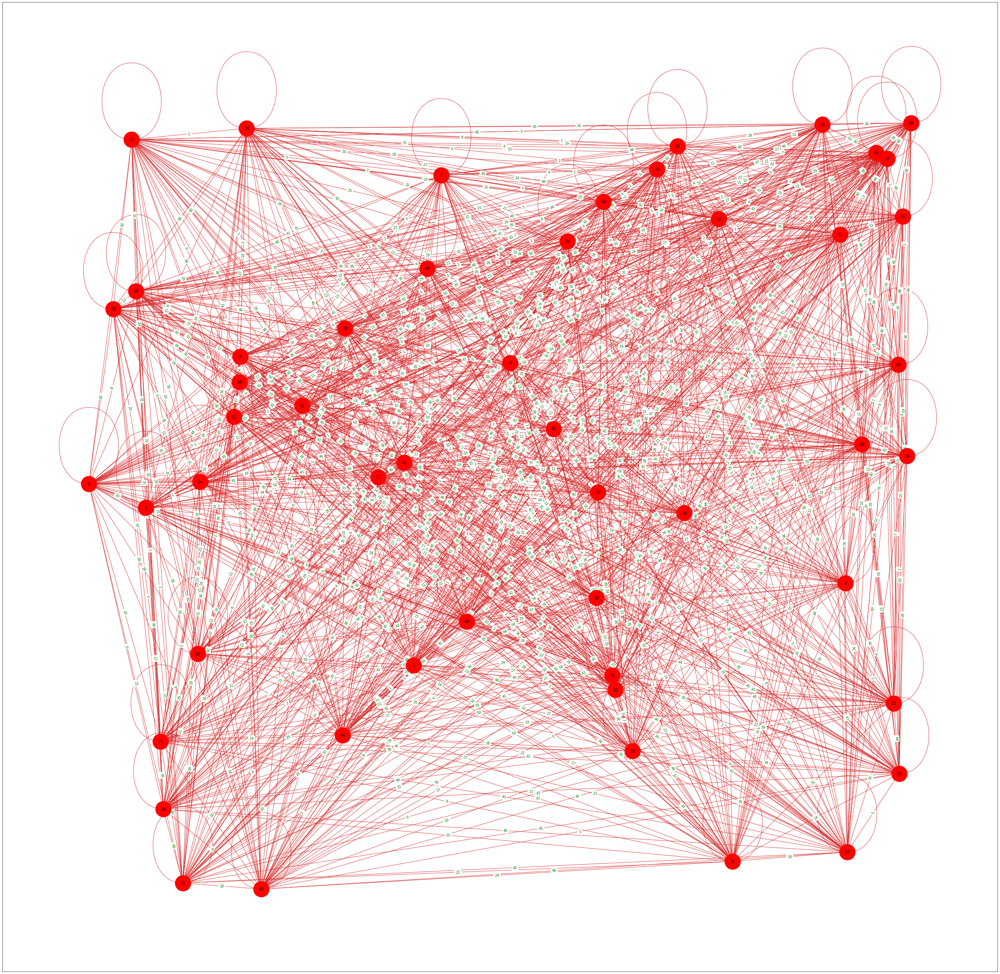

In [32]:
drawGraph(graph)






Cross Over Function Used : orderCrossOverFunction





0.0
[888, 906, 924, 927, 938, 939, 946, 949, 954, 975, 982, 986, 994, 995, 995, 1000, 1000, 1002, 1004, 1008, 1009, 1018, 1020, 1021, 1024, 1025]
25.0
[169, 171, 172, 174, 175, 175, 175, 176, 176, 177, 177, 177, 177, 178, 178, 178, 179, 179, 180, 180, 180, 181, 181, 181, 181, 182]
50.0
[154, 154, 154, 154, 155, 155, 155, 155, 156, 156, 156, 156, 157, 157, 157, 157, 158, 158, 158, 158, 158, 158, 160, 160, 160, 160]
75.0
[154, 154, 154, 154, 155, 155, 155, 155, 156, 156, 156, 157, 157, 157, 157, 158, 158, 158, 158, 158, 158, 158, 158, 160, 160, 160]



Total Time Taken for 5000 generations using orderCrossOverFunction crossover is 55.995628 seconds 






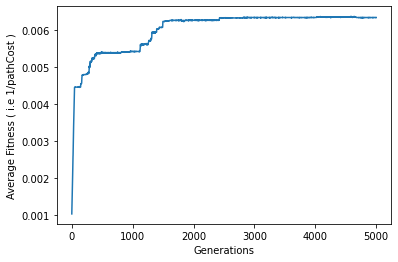

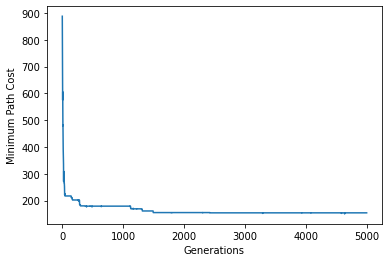

Minimum Path Cost :  150
Minimum Path Cost Generation :  4638
Path :  [1, 23, 26, 25, 11, 12, 13, 36, 3, 2, 8, 14, 46, 28, 27, 39, 43, 42, 41, 40, 10, 47, 48, 34, 4, 19, 24, 49, 33, 32, 31, 51, 50, 22, 21, 20, 44, 6, 7, 29, 16, 9, 45, 17, 18, 30, 38, 37, 5, 15, 35, 1]


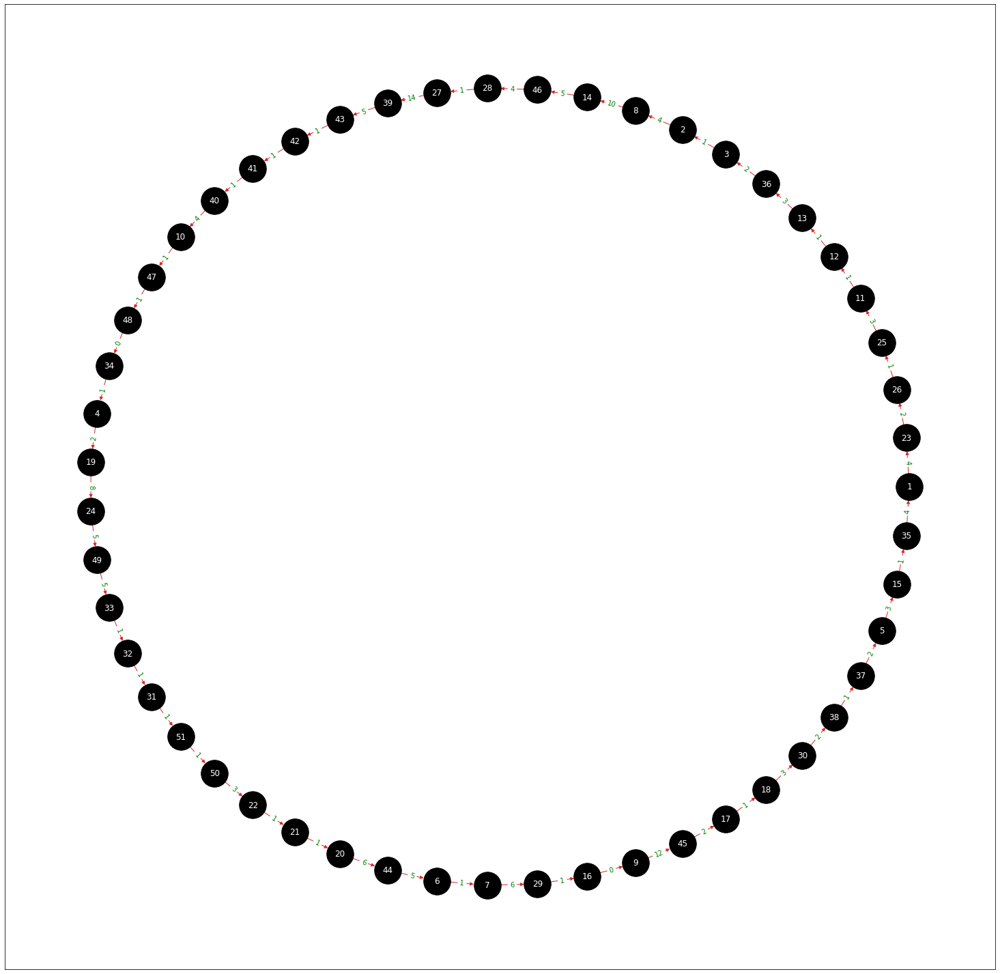

In [42]:

MinOffspring ,MinOffSpringGeneration, avgFitnessScore , minPathScore = GeneticAlgorithm(graph , Time=5000 , populationSize=100 ,crossOverFunction=orderCrossOverFunction , mutationRate=0.05 , selectionPercentage=25)
XAxis = [x[0] for x in avgFitnessScore]
YAxis = [x[1] for x in avgFitnessScore]
drawPlot(XAxis , "Generations" , YAxis ,"Average Fitness ( i.e 1/pathCost )" )
XAxis = [x[0] for x in minPathScore]
YAxis = [x[1] for x in minPathScore]
drawPlot(XAxis , "Generations" , YAxis , "Minimum Path Cost")

print("Minimum Path Cost : " , MinOffspring.pathCost)
print("Minimum Path Cost Generation : " , MinOffSpringGeneration)

print("Path : " , MinOffspring.path)

printPath(MinOffspring.path , graph)






Cross Over Function Used : PartialMappedCrossover





0.0
[876, 914, 931, 935, 944, 960, 960, 967, 969, 970, 970, 978, 987, 987, 991, 993, 997, 1001, 1003, 1004, 1005, 1008, 1011, 1014, 1015, 1016, 1019, 1027, 1027, 1027, 1028, 1033, 1034, 1034, 1034]
25.0
[174, 176, 177, 178, 178, 179, 179, 179, 180, 180, 180, 180, 181, 181, 182, 182, 182, 182, 183, 183, 183, 183, 183, 183, 183, 184, 184, 184, 184, 184, 184, 185, 185, 185, 186]
50.0
[138, 140, 140, 141, 142, 142, 143, 144, 144, 145, 146, 147, 151, 152, 153, 154, 154, 154, 154, 155, 155, 156, 156, 156, 156, 156, 156, 156, 157, 157, 157, 157, 157, 158, 158]
75.0
[122, 124, 124, 125, 125, 126, 126, 126, 127, 127, 127, 128, 128, 128, 128, 128, 128, 129, 129, 129, 130, 130, 130, 130, 130, 131, 131, 131, 131, 132, 132, 132, 133, 133, 134]



Total Time Taken for 5000 generations using PartialMappedCrossover crossover is 61.920636 seconds 






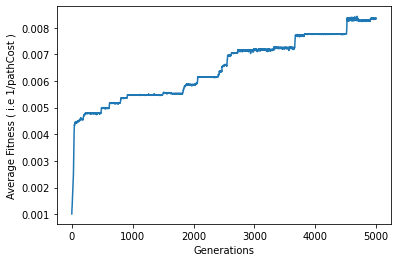

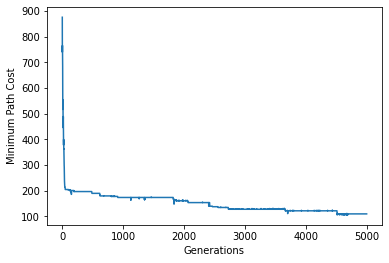

Minimum Path Cost :  106
Minimum Path Cost Generation :  4516
Path :  [1, 7, 14, 9, 5, 12, 13, 40, 3, 4, 10, 49, 26, 16, 39, 38, 46, 27, 28, 17, 45, 20, 21, 6, 30, 29, 44, 36, 37, 31, 51, 41, 19, 22, 24, 25, 2, 50, 42, 43, 32, 33, 8, 47, 48, 18, 11, 15, 35, 34, 23, 1]


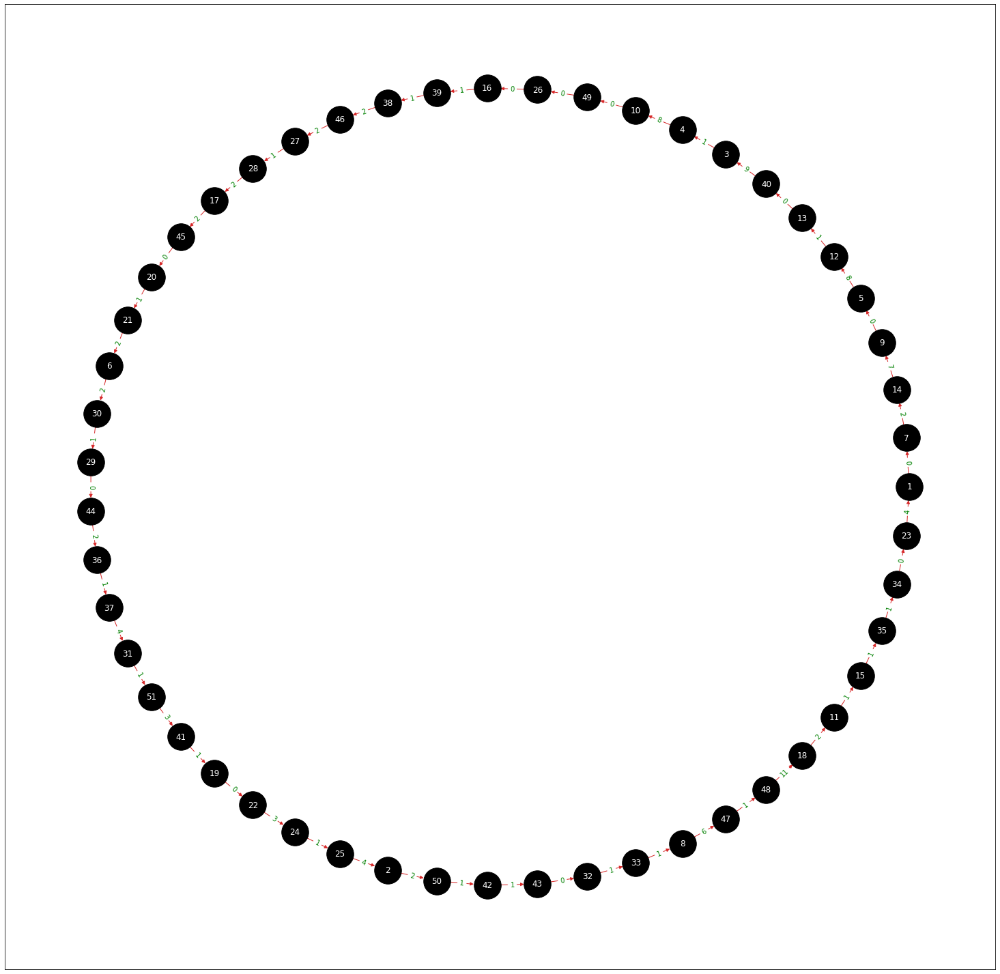

In [43]:

MinOffspring ,MinOffSpringGeneration, avgFitnessScore , minPathScore = GeneticAlgorithm(graph , Time=5000 , populationSize=100 ,crossOverFunction=PartialMappedCrossover , mutationRate=0.01 , selectionPercentage=35)
XAxis = [x[0] for x in avgFitnessScore]
YAxis = [x[1] for x in avgFitnessScore]
drawPlot(XAxis , "Generations" , YAxis ,"Average Fitness ( i.e 1/pathCost )" )
XAxis = [x[0] for x in minPathScore]
YAxis = [x[1] for x in minPathScore]
drawPlot(XAxis , "Generations" , YAxis , "Minimum Path Cost")

print("Minimum Path Cost : " , MinOffspring.pathCost)
print("Minimum Path Cost Generation : " , MinOffSpringGeneration)

print("Path : " , MinOffspring.path)

printPath(MinOffspring.path , graph)






Cross Over Function Used : randomCrossover





0.0
[930, 935, 951, 969, 975, 988, 998, 1004, 1005, 1007, 1011, 1015, 1020]
25.0
[494, 496, 499, 501, 502, 504, 504, 505, 506, 507, 508, 510, 511]
50.0
[389, 403, 405, 405, 409, 411, 411, 412, 412, 415, 415, 417, 418]
75.0
[367, 368, 375, 382, 387, 388, 389, 391, 392, 393, 393, 394, 394]



Total Time Taken for 100 generations using randomCrossover crossover is 0.561913 seconds 






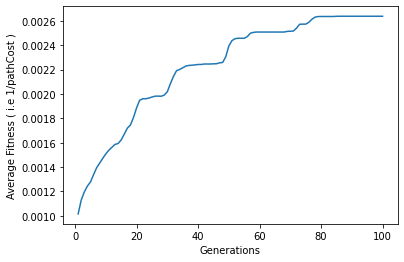

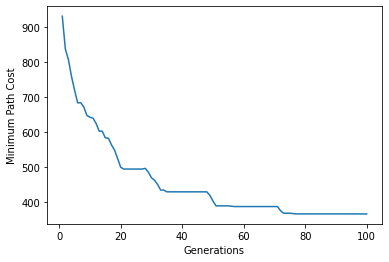

Minimum Path Cost :  366
Minimum Path Cost Generation :  77
Path :  [1, 51, 8, 7, 29, 11, 32, 42, 24, 2, 6, 44, 27, 23, 45, 13, 21, 20, 14, 18, 17, 35, 34, 43, 37, 36, 19, 41, 5, 15, 30, 3, 4, 33, 9, 22, 39, 46, 38, 10, 50, 26, 48, 28, 31, 40, 47, 49, 25, 16, 12, 1]


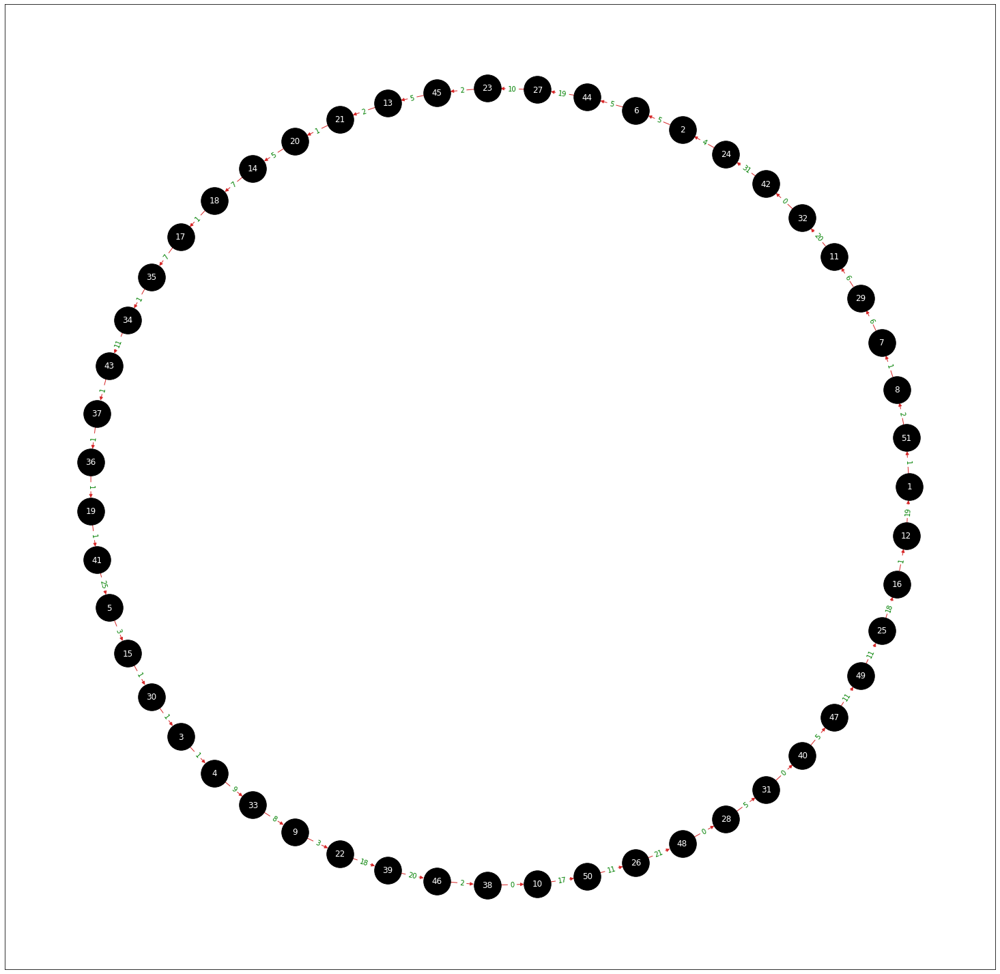

In [44]:

MinOffspring ,MinOffSpringGeneration, avgFitnessScore , minPathScore = GeneticAlgorithm(graph , Time=100 , populationSize=50 ,crossOverFunction=randomCrossover , mutationRate=0.01 , selectionPercentage=25)
XAxis = [x[0] for x in avgFitnessScore]
YAxis = [x[1] for x in avgFitnessScore]
drawPlot(XAxis , "Generations" , YAxis ,"Average Fitness ( i.e 1/pathCost )" )
XAxis = [x[0] for x in minPathScore]
YAxis = [x[1] for x in minPathScore]
drawPlot(XAxis , "Generations" , YAxis , "Minimum Path Cost")

print("Minimum Path Cost : " , MinOffspring.pathCost)
print("Minimum Path Cost Generation : " , MinOffSpringGeneration)

print("Path : " , MinOffspring.path)

printPath(MinOffspring.path , graph)